In [1]:
import jax, optax, sys, os, json, pickle, time
import orbax.checkpoint
import jax_amber3 as jaa
import numpy as np
import numpy.random as npr
import matplotlib.pyplot as plt
import mdtraj as md
import netCDF4 as nc
import jax.numpy as jnp
from flax import linen as nn 
from flax.training import train_state, orbax_utils
jax.config.update("jax_enable_x64", True)

In [2]:
jax.print_environment_info(), jax.default_backend()

jax:    0.4.25
jaxlib: 0.4.23.dev20240229
numpy:  1.26.4
python: 3.12.2 | packaged by conda-forge | (main, Feb 16 2024, 20:50:58) [GCC 12.3.0]
jax.devices (1 total, 1 local): [cuda(id=0)]
process_count: 1
platform: uname_result(system='Linux', node='genuinely-jolly-jackalope', release='5.15.0-100-generic', version='#110-Ubuntu SMP Wed Feb 7 13:27:48 UTC 2024', machine='x86_64')


$ nvidia-smi
Sun Mar 17 21:21:09 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.129.03             Driver Version: 535.129.03   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|===============================

(None, 'gpu')

In [3]:
#Batching data (class usage and slight alterations of code will allow me to store information about the data stream as atrributes)
class Data_stream():
    def __init__(self, rng_seed, num_total, num_batches, batch_size, data):
        self.rng_seed = rng_seed
        self.num_total = num_total
        self.num_batches = num_batches
        self.batch_size = batch_size
        self.data = data
        
    def __iter__(self):
        rng = npr.RandomState(self.rng_seed)
        while True:
            perm = rng.permutation(self.num_total)
            for i in range(self.num_batches):
                batch_idx = perm[i * self.batch_size:(i + 1) * self.batch_size]
                yield self.data[batch_idx]

def reparameterize(z_rng, z_mean, z_logvar):
    z_std = jnp.exp(0.5*z_logvar)
    z_eps = jax.random.normal(z_rng, z_logvar.shape)
    return z_mean + z_eps*z_std 


#VAE Classes
class V_Encoder(nn.Module):
    d_hidden: list
    latents: int
    dropout_rates: list
    
    @nn.compact
    def __call__(self, x):
        for i in range(len(self.d_hidden)):
            x = nn.relu(nn.Dense(self.d_hidden[i])(x))
            x = nn.Dropout(rate=self.dropout_rates[i])(x, deterministic=True)
        mean_x = nn.Dense(self.latents, name='fc5_mean')(x)
        logvar_x = nn.Dense(self.latents, name='fc5_logvar')(x)
        return mean_x, logvar_x 

class Encoder(nn.Module):
    d_hidden: list
    latents: int
    dropout_rates: list

    @nn.compact
    def __call__(self, x):
        for i in range(len(self.d_hidden)):
            x = nn.relu(nn.Dense(self.d_hidden[i])(x))
            x = nn.Dropout(rate=self.dropout_rates[i])(x, deterministic=True)
        x = nn.Dense(self.latents, name='f5')(x)
        return x
    
class Decoder(nn.Module):
    d_hidden: list
    out_dim: int
    dropout_rates: list

    @nn.compact
    def __call__(self, z):
        for i in range(len(self.d_hidden))[::-1]:
            z = nn.relu(nn.Dense(self.d_hidden[i])(z))
            z = nn.Dropout(rate=self.dropout_rates[i])(z, deterministic=True)
        z = nn.Dense(self.out_dim, name='f5')(z)
        return z
        
class AE(nn.Module):
    input_size: int
    hidden_layers: tuple
    dropout_rates: list
    latents: int

    def setup(self):
        self.encoder = Encoder(list(self.hidden_layers), self.latents, self.dropout_rates)
        self.decoder = Decoder(list(self.hidden_layers), self.input_size, self.dropout_rates)
    
    def __call__(self, x, z_rng):
        z_latent = self.encoder(x)
        return self.decoder(z_latent), z_latent
    
    def encode(self, x, z_rng):
        return self.encoder(x)
    
    def decode(self, z, z_rng):
        return self.decoder(z)
        
class VAE(nn.Module):
    input_size: int
    hidden_layers: tuple
    dropout_rates: list
    latents: int
        
    def setup(self):
        self.encoder = V_Encoder(list(self.hidden_layers), self.latents, self.dropout_rates)
        self.decoder = Decoder(list(self.hidden_layers), self.input_size, self.dropout_rates)

    def __call__(self, x, z_rng):
        z_mean, z_logvar = self.encoder(x)
        z = reparameterize(z_rng, z_mean, z_logvar)
        return self.decoder(z), z_mean, z_logvar
    
    def construct(self, z_mean, z_logvar, z_rng):
        z = reparameterize(z_rng, z_mean, z_logvar)
        return self.decoder(z)
    
    def encode(self, x, z_rng):
        return self.encoder(x)
    
    def decode(self, z, z_rng):
        return self.decoder(z)
    
    def mvn_latent_model(self, x, z_rng):
        return NotImplemented()

In [4]:
@jax.vmap
def atom_rmsd(a, b, potential_coefficient=None): # for arrays of (n_conf, n_atom*3)
    mn = a.shape[-1]//3
    x_inds, y_inds, z_inds = jnp.arange(0,mn), jnp.arange(mn, 2*mn), jnp.arange(2*mn, 3*mn)
    return jnp.sqrt(jnp.mean((b[x_inds] - a[x_inds])**2 + (b[y_inds] - a[y_inds])**2 + (b[z_inds] - a[z_inds])**2))

@jax.jit
def scaled_pot_enr_diff(a, b, potential_coefficient=None): # WITH A AS BATCH AND B AS RECON
    return ((gas_fun(a) - gas_fun(b))/gas_fun(a))**2 #Unitless quantity

@jax.jit
def summation_loss(a, b, potential_coefficient): # LET A BE BATCH AND B BE RECON
    # Make this the square root of the mean of the sum of squares of elements
    return atom_rmsd(a,b) + potential_coefficient * scaled_pot_enr_diff(a, b)

@jax.jit
def rmsd_step(state, batch_x, z_rng, potential_coefficient):
    def loss_fn(params, apply_fn):
        recon_x = apply_fn({'params':params}, batch_x, z_rng)[0]
        return jnp.sqrt(jnp.sum(atom_rmsd(batch_x, recon_x)**2))
    grads = jax.grad(loss_fn)(state.params, state.apply_fn)
    return state.apply_gradients(grads=grads)

@jax.jit
def rmsd_log_step(state, batch_x, z_rng, potential_coefficient):
    def loss_fn(params, apply_fn):
        recon_x = apply_fn({'params':params}, batch_x, z_rng)[0]
        return jnp.log(jnp.sqrt(jnp.sum(atom_rmsd(batch_x, recon_x)**2)))
    grads = jax.grad(loss_fn)(state.params, state.apply_fn)
    return state.apply_gradients(grads=grads)

@jax.jit
def potential_step(state, batch_x, z_rng, potential_coefficient):
    def loss_fn(params, apply_fn):
        recon_x = apply_fn({'params':params}, batch_x, z_rng)[0]
        return scaled_pot_enr_diff(batch_x, recon_x).mean()
    grads = jax.grad(loss_fn)(state.params, state.apply_fn)
    return state.apply_gradients(grads=grads)    

@jax.jit
def summation_step(state, batch_x, z_rng, potential_coefficient, weights=(1,1)):
    def loss_fn(params, apply_fn):
        recon_x = apply_fn({'params':params}, batch_x, z_rng)[0]
        return summation_loss(batch_x, recon_x, potential_coefficient).mean()
    grads = jax.grad(loss_fn)(state.params, state.apply_fn)
    return state.apply_gradients(grads=grads)

In [5]:
class NN_Experiment():
    def __init__(self, json_fn, make_dirs=True, from_json_params=False):
        """
        n_latents: int: number of latent dimensions
        coord_set: jnp.array(): data from which both test and train set will be derived
        test_slice: int in (0,1,2,3,4): which 80/20 slice of coord_set to take for test and train
        data_dir: string: directory (with trailing slash) in which to store all output data, images, etc.
        batch_size: int: default 400; number of frames in a training batch
        learning_rate: float: default 1e-4; optax adam learning rate
        dropout_rates: list of floats: encoder and decoder dropout rates forward for encoder and reverse for decoder
        """
        #Get the information from the json file
        if not from_json_params:
            with open(json_fn, 'r') as g:
                self.json_params = json.load(g)
        else:
            #To use json parameters that are already in memeory, not just the file name, make from_json_params True and pass the params instead of the json_fn
            self.json_params = json_fn
        
        #Files
        fname_dcd = self.json_params["fname_dcd"]
        fname_prmtop = self.json_params["fname_prmtop"]
        self.n_latents = self.json_params["latent_dim"] #number of latents
        test_slice = self.json_params["test_slice"] #int zero to four inclusive for 20/80 split of test and train
        model_name = self.json_params["model_name"] #string for the model name
        save_dir = self.json_params["save_dir"] #with trailing slash:
        data_start, data_end = self.json_params["data_slice_start"], self.json_params["data_slice_end"] #Slice of data
        self.batch_size = self.json_params["batch_size"]
        learning_rate = self.json_params["learning_rate"]
        dropout_rates = self.json_params["dropout_rates"]
        model_type = self.json_params["model_type"]
        self.model_name = model_name
        
        #Establish Model Directory
        model_dir = os.path.join(save_dir, f'{self.model_name}/')
        if not os.path.isdir(model_dir) and make_dirs:
            os.mkdir(model_dir)
        
        #Establish Data Directory
        if self.json_params["data_dir"] == 'None':
            latent_dir = os.path.join(model_dir, f'{self.n_latents:02d}_latents/')
            self.data_dir = os.path.join(latent_dir, f'rpt_{test_slice}/')
            if not os.path.isdir(latent_dir) and make_dirs:
                os.mkdir(latent_dir)
        else:
            self.data_dir = self.json_params["data_dir"]
        
        if not os.path.isdir(self.data_dir) and make_dirs:
            os.mkdir(self.data_dir)
        
        if data_end == 'None':
            data_end = None
        
        #Load and Align
        c = md.load(fname_dcd, top=fname_prmtop)
        c = c.superpose(c) # FEED IN ALIGNED DATA
        coord_set = jnp.array(c.xyz.reshape(c.xyz.shape[0], -1))[data_start:data_end]
        num_samples, input_size = coord_set.shape
        
        global gas_fun
        gas_fun, _ = jaa.get_amber_functions(fname_prmtop)
        
        #make hidden layers
        hidden_layers = [input_size]*3
        
        #make test and train sets
        test_indices = np.array(range(test_slice, num_samples, 5)) #every fifth frame
        train_indices = np.array([element for element in range(num_samples) if element not in test_indices])
        self.test_data = coord_set[test_indices]
        self.train_data = coord_set[train_indices]
        print(self.train_data.shape, self.test_data.shape)
        
        #Initialize Model
        assert model_type in ['VAE', 'AE']
        self.model_type = model_type
        
        if model_type == 'VAE':
            self.model = VAE(input_size=input_size, latents=self.n_latents,
                             hidden_layers=hidden_layers, dropout_rates=dropout_rates)
        elif model_type == 'AE':
            self.model = AE(input_size=input_size, latents=self.n_latents,
                            hidden_layers=hidden_layers, dropout_rates=dropout_rates)
        
        rng_init = jax.random.PRNGKey(self.n_latents)
        rng, key = jax.random.split(rng_init)
        self.state = train_state.TrainState.create(apply_fn=self.model.apply,
                                                   params=self.model.init(key, coord_set, rng_init)['params'],
                                                   tx=optax.adam(learning_rate=learning_rate))
        self.epoch = 0
        self.current_potential_coefficient = 0

        #Checkpointer
        self.orbax_checkpointer = orbax.checkpoint.PyTreeCheckpointer()
        options = orbax.checkpoint.CheckpointManagerOptions(max_to_keep=2, create=True)
        self.checkpoint_manager = orbax.checkpoint.CheckpointManager(os.path.join(self.data_dir, 'checkpoint_managed'), self.orbax_checkpointer, options)
        
        num_train = self.train_data.shape[0]
        num_complete_batches, leftover = divmod(num_train, self.batch_size)
        self.num_train_batches = num_complete_batches + bool(leftover)
        self.train_batches = Data_stream(self.n_latents, num_train, self.num_train_batches, self.batch_size, self.train_data)
        
        num_test = self.test_data.shape[0]
        num_complete_batches, leftover = divmod(num_test, self.batch_size)
        self.num_test_batches = num_complete_batches + bool(leftover)
        self.test_batches = Data_stream(self.n_latents, num_test, self.num_test_batches, self.batch_size, self.test_data)
        
        #Initialize data_storage
        self.nc_data_file = os.path.join(self.data_dir, f'model_{self.model_name}_{self.n_latents:02d}.nc')
        self.establish_netcdf(self.nc_data_file)
        
        print(self.model)
        print("INITIALIZATION COMPLETE")

    def establish_netcdf(self, nc_filename):
        rootgrp = nc.Dataset(nc_filename, 'w', format='NETCDF4')
        traingrp = rootgrp.createGroup('Train')
        testgrp = rootgrp.createGroup('Test')

        traingrp.createDimension('epoch', None)
        traingrp.createDimension('batch', self.num_train_batches)
        traingrp.createDimension('frame', self.batch_size)

        testgrp.createDimension('epoch', None)
        testgrp.createDimension('batch', self.num_test_batches)
        testgrp.createDimension('frame', self.batch_size)

        for grp in [traingrp, testgrp]:
            rmsd = grp.createVariable('RMSD', 'f4', ('epoch', 'batch', 'frame',))
            rmsd.units = "Nanometer"
            pot = grp.createVariable('Potential', 'f8', ('epoch', 'batch', 'frame',))
            pot.units = "KJ/mol"
            summ = grp.createVariable('Summation', 'f8', ('epoch', 'batch', 'frame',))
            summ.units = 'Unitless'
            grp.history = "Created" + time.ctime(time.time())

        coef = traingrp.createVariable('Potential Coefficient', 'f4', ('epoch',))
        coef.units = 'Unitless'
            
        self.traingrp, self.testgrp = traingrp, testgrp

    
    def write_model_to_ckpt(self, ckpt_fn=None):
        if ckpt_fn is None:
            ckpt_fn = os.path.join(self.data_dir, f'model_ckpt_{self.epoch:06d}.pkl')
        
        save_args = orbax_utils.save_args_from_target(self.state)
        self.orbax_checkpointer.save(ckpt_fn, self.state, save_args=save_args)

    def load_model_from_ckpt(self, chkpt_fn, restore_step):
        self.state = self.orbax_checkpointer.restore(chkpt_fn, item=self.state)
    
    def write_traj(self, identifier, traj_xyz): #(n conf, n_atoms*3) OR (n conf, n_atoms, 3)
        fname = self.data_dir + f'{identifier}_{self.model_name}{self.n_latents:02d}.dcd'
        
        if traj_xyz.shape[-1] != 3:
            traj_xyz = traj_xyz.reshape(traj_xyz.shape[0], -1, 3)
        
        with md.formats.DCDTrajectoryFile(fname, 'w') as f:
            f.write (traj_xyz*10) #*10 because mdtraj loads data in nm but saves it in angstrom
    
    def write_decoded_traj(self, idfn=None):
        rng = jax.random.PRNGKey(self.epoch)
        rng, key = jax.random.split(rng)
        recon_test = self.state.apply_fn({'params':self.state.params}, self.test_data, rng)
        if idfn != None:
            self.write_traj(idfn, recon_test[0])
        else:
            self.write_traj(f"recon_test", recon_test[0])
    
    def eval_batches(self, batch_set, eval_function, potential_coefficient):
        vals = []
        f = iter(batch_set)
        
        for i in range(batch_set.num_batches):
            #Get Batch
            batch = next(f)
            rng = jax.random.PRNGKey(self.epoch)
            rng, key = jax.random.split(rng)
            recon = self.state.apply_fn({'params':self.state.params}, batch, rng)[0]
            #Eval Batch
            vals.append(eval_function(batch, recon, potential_coefficient))
        
        return jnp.array(vals)
        
    def eval_losses(self, rng, potential_coefficient):
        """
        Shape of return is train_rmsd, train_potential, train_summ, test_rmsd, test_potential, test_summ, lambda
        """
        #After all batches seen this epoch
        #recon_train = self.state.apply_fn({'params':self.state.params}, self.train_data, rng)
        #recon_test = self.state.apply_fn({'params':self.state.params}, self.test_data, rng)

        self.traingrp.variables['RMSD'][self.epoch, :, :] = self.eval_batches(self.train_batches, atom_rmsd, None)
        self.testgrp.variables['RMSD'][self.epoch, :, :] = self.eval_batches(self.test_batches, atom_rmsd, None)
        
        self.traingrp.variables['Potential'][self.epoch, :, :] = self.eval_batches(self.train_batches, scaled_pot_enr_diff, None)
        self.testgrp.variables['Potential'][self.epoch, :, :] = self.eval_batches(self.test_batches, scaled_pot_enr_diff, None)
        
        self.traingrp.variables['Summation'][self.epoch, :, :] = self.eval_batches(self.train_batches, summation_loss, potential_coefficient)
        self.testgrp.variables['Summation'][self.epoch, :, :] = self.eval_batches(self.test_batches, summation_loss, potential_coefficient)

        self.traingrp.variables['Potential Coefficient'][self.epoch] = potential_coefficient
        
        most_recent_results = []
        for grp in (self.traingrp, self.testgrp):
            for variable in ['RMSD', 'Potential', 'Summation']:
                most_recent_results.append(grp.variables[variable][self.epoch, :, :].mean())
        most_recent_results.append(self.traingrp.variables['Potential Coefficient'][self.epoch])
        
        return most_recent_results
    
    #def save_loss_data(self):
    #    #LOSSES
    #    loss_names = ['RMSD', 'POTENTIAL', 'SUMM']
    #    for arr in (self.rmsd_loss, self.pot_enr_loss, self.summ_loss):
    #        np.save(self.data_dir + f'{self.model_name}{self.n_latents:02d}_{loss_names.pop(0)}.npy', np.array(arr))
    #    #LAMBDAS
    #    np.save(self.data_dir + f'{self.model_name}{self.n_latents:02d}_lambdas.npy', np.array(self.potential_coefficients))
    
    def train_batches_on_step(self, batch_set, step_function, potential_coefficient):
        f = iter(batch_set)
        for i in range(batch_set.num_batches):
            #Get Batch
            batch = next(f)
            #Train Batch
            rng = jax.random.PRNGKey(self.epoch)
            rng, key = jax.random.split(rng)
            self.state = step_function(self.state, batch, rng, potential_coefficient)
        #After ANY EPOCH
        save_args = orbax_utils.save_args_from_target(self.state)
        self.checkpoint_manager.save(self.epoch, self.state, save_kwargs={'save_args': save_args})
        
    def train_nepochs_on_rmsd(self, num_rmsd_epochs):
        """
        Train on the RMSD function alone, potential coefficient is zero
        """
        
        while self.epoch < num_rmsd_epochs:
            #Training
            self.train_batches_on_step(self.train_batches, rmsd_step, self.current_potential_coefficient)
            rng = jax.random.PRNGKey(self.epoch)
            rng, key = jax.random.split(rng)
            #After all batches seen this epoch
            last_loss = self.eval_losses(rng, self.current_potential_coefficient)
            
            print('epoch', self.epoch,
                  'atom_rmsd_nm', '%.4E'%last_loss[0], '%.4E'%last_loss[3],
                  'dPotEnr', '%.4E'%last_loss[1], '%.4E'%last_loss[4],
                  'Summation', '%.4E'%last_loss[2], '%.4E'%last_loss[5],
                  'L=%.4E'%last_loss[6])
            self.epoch += 1
        return self.epoch

    def train_rmsd_threshold(self, nm_cutoff=0.1, num_move_ave=10):
        """Train on the RMSD until a nm_cutoff is reached of the last num_mov_ave epochs
            Stop training if the threshold is reached, or the RMSD_loss of the test set is rising
        """
        rmsd_above_threshold = True
        test_rmsd_decreasing = True

        while rmsd_above_threshold and test_rmsd_decreasing:
            #Training
            self.train_batches_on_step(self.train_batches, rmsd_step, self.current_potential_coefficient)
            rng = jax.random.PRNGKey(self.epoch)
            rng, key = jax.random.split(rng)
            #After all batches seen this epoch
            last_loss = self.eval_losses(rng, self.current_potential_coefficient)
            print('epoch', self.epoch,
                  'atom_rmsd_nm', '%.4E'%last_loss[0], '%.4E'%last_loss[3],
                  'dPotEnr', '%.4E'%last_loss[1], '%.4E'%last_loss[4],
                  'Summation', '%.4E'%last_loss[2], '%.4E'%last_loss[5],
                  'L=%.4E'%last_loss[6])
            self.epoch += 1
            rmsd_above_threshold = self.traingrp['RMSD'][-num_move_ave:, :, :].mean() > nm_cutoff or self.testgrp['RMSD'][-num_move_ave:, :, :].mean() > nm_cutoff
            test_rmsd_decreasing = self.testgrp['RMSD'][-2*num_move_ave:-num_move_ave, :, :].mean() > self.testgrp['RMSD'][-num_move_ave:, :, :].mean()

        if not rmsd_above_threshold:
            print('RMSD Threshold Run - Break Reason - Threshold Reached')
        if not test_rmsd_decreasing:
            print('RMSD Threshold Run - Break Reason - Test Set Loss Increasing')
        
        return self.epoch

    def train_rmsd_to_lowest(self, num_move_ave=10):
        """Train on the RMSD until overtraining is deteceted
            Stop training if the RMSD_loss of the test set is rising
        """
        test_rmsd_decreasing = True

        while test_rmsd_decreasing:
            #Training
            self.train_batches_on_step(self.train_batches, rmsd_log_step, self.current_potential_coefficient)
            rng = jax.random.PRNGKey(self.epoch)
            rng, key = jax.random.split(rng)
            #After all batches seen this epoch
            last_loss = self.eval_losses(rng, self.current_potential_coefficient)
            print('epoch', self.epoch,
                  'atom_rmsd_nm', '%.4E'%last_loss[0], '%.4E'%last_loss[3],
                  'dPotEnr', '%.4E'%last_loss[1], '%.4E'%last_loss[4],
                  'Summation', '%.4E'%last_loss[2], '%.4E'%last_loss[5],
                  'L=%.4E'%last_loss[6])
            self.epoch += 1
            test_rmsd_decreasing = self.testgrp['RMSD'][-2*num_move_ave:-num_move_ave, :, :].mean() > self.testgrp['RMSD'][-num_move_ave:, :, :].mean()

        if not test_rmsd_decreasing:
            print('RMSD Lowest Run - Break Reason - Test Set Loss Increasing')
        
        return self.epoch
    
    def train_potential_threshold(self, potential_coefficient=1, potential_threshold=1e-3, num_mov_ave=10):
        self.current_potential_coefficient = potential_coefficient
        potential_above_threshold = True
        test_potential_decreasing = True

        while potential_above_threshold and test_potential_decreasing:
            # Training
            self.train_batches_on_step(self.train_batches, potential_step, self.current_potential_coefficient)
            rng = jax.random.PRNGKey(self.epoch)
            rng, key = jax.random.split(rng)
            #After all batches seen this epoch
            last_loss = self.eval_losses(rng, self.current_potential_coefficient)
            print('epoch', self.epoch,
                  'atom_rmsd_nm', '%.4E'%last_loss[0], '%.4E'%last_loss[3],
                  'dPotEnr', '%.4E'%last_loss[1], '%.4E'%last_loss[4],
                  'Summation', '%.4E'%last_loss[2], '%.4E'%last_loss[5],
                  'L=%.4E'%last_loss[6])
            self.epoch += 1
            potential_above_threshold = (self.traingrp['Potential'][-num_move_ave:, :, :].mean() > potential_threshold or
                                         self.testgrp['Potential'][-num_move_ave:, :, :].mean() > potential_threshold)
            test_potential_decreasing = self.testgrp['Potential'][-2*num_move_ave:-num_move_ave, :, :].mean() > self.testgrp['Potential'][-num_move_ave:, :, :].mean()

        if not potential_above_threshold:
            print('Potential Threshold Run - Break Reason - Threshold Reached')
        if not test_potential_decreasing:
            print('Potential Threshold Run - Break Reason - Test Set Loss Increasing')
        
        return self.epoch

    def train_scaling_potential(self):
        """Scale the potential in by frequently changing the coefficient to make potential equal to rmsd"""
        # Every five epochs choose lambda as min(1, max(1.01*lambda[-1], RMSD/NSD))
        while self.current_potential_coefficient < 1:
            # Training
            self.train_batches_on_step(self.train_batches, summation_step, self.current_potential_coefficient)
            rng = jax.random.PRNGKey(self.epoch)
            rng, key = jax.random.split(rng)
            #After all batches seen this epoch
            last_loss = self.eval_losses(rng, self.current_potential_coefficient)
            print('epoch', self.epoch,
                  'atom_rmsd_nm', '%.4E'%last_loss[0], '%.4E'%last_loss[3],
                  'dPotEnr', '%.4E'%last_loss[1], '%.4E'%last_loss[4],
                  'Summation', '%.4E'%last_loss[2], '%.4E'%last_loss[5],
                  'L=%.4E'%last_loss[6])
            self.epoch += 1
            #Get the next pot_coef every 5 epochs
            if self.epoch % 5 == 0:
                #Choose the smaller between 1 and x, where x is the larger of (RMSD/Potential, 1% increase in the current coefficient)
                self.current_potential_coefficient = np.min((1, np.max((1.01*self.current_potential_coefficient, (self.traingrp.variables['RMSD'][-5:, :, :].mean() / self.traingrp.variables['Potential'][-5:, :, :].mean())))))
        print('Scaling Complete')
        return self.epoch

    def train_summation_threshold(self, potential_coefficient=1, potential_threshold=1e-3, num_mov_ave=10):
        """
        Exactly the same as potential threshold, except the summation step is used instead
        """
        self.current_potential_coefficient = potential_coefficient
        potential_above_threshold = True
        test_potential_decreasing = True

        while potential_above_threshold and test_potential_decreasing:
            # Training
            self.train_batches_on_step(self.train_batches, summation_step, self.current_potential_coefficient)
            rng = jax.random.PRNGKey(self.epoch)
            rng, key = jax.random.split(rng)
            #After all batches seen this epoch
            last_loss = self.eval_losses(rng, self.current_potential_coefficient)
            print('epoch', self.epoch,
                  'atom_rmsd_nm', '%.4E'%last_loss[0], '%.4E'%last_loss[3],
                  'dPotEnr', '%.4E'%last_loss[1], '%.4E'%last_loss[4],
                  'Summation', '%.4E'%last_loss[2], '%.4E'%last_loss[5],
                  'L=%.4E'%last_loss[6])
            self.epoch += 1
            potential_above_threshold = (self.traingrp['Potential'][-num_move_ave:, :, :].mean() > potential_threshold or
                                         self.testgrp['Potential'][-num_move_ave:, :, :].mean() > potential_threshold)
            test_potential_decreasing = self.testgrp['Potential'][-2*num_move_ave:-num_move_ave, :, :].mean() > self.testgrp['Potential'][-num_move_ave:, :, :].mean()
        
        if not potential_above_threshold:
            print('Potential Threshold Run - Break Reason - Threshold Reached')
        if not test_potential_decreasing:
            print('Potential Threshold Run - Break Reason - Test Set Loss Increasing')
        
        return self.epoch

    def MAIN_train_rmsd_only(self):
        self.train_nepochs_on_rmsd(100)
        self.train_rmsd_to_lowest()

In [6]:
json_params = {"fname_dcd": "/media/volume/Soohaeng/depaolo/Deep-MMS/Simulation/decaalanine_1us_split3.dcd",
               "fname_prmtop": "/media/volume/Soohaeng/depaolo/Deep-MMS/Simulation/ala_deca_peptide.prmtop",
               "save_dir": "/media/volume/Soohaeng/depaolo/Deep-MMS/",
               "data_dir": "None",
               "max_epoch": 30000,
               "latent_dim": 64,
               "test_slice": 1,
               "data_slice_start": 0,
               "data_slice_end": "None",
               "model_name": "AE_Dropout_RMSD_only",
               "batch_size": 2000,
               "learning_rate": 1e-06,
               "dropout_rates": [0.1, 0.1, 0.1],
               "potential_threshold": 0.05, "model_type": "AE"}

In [7]:
#Init Experiment
experiment = NN_Experiment(json_params, from_json_params=True)

(8000, 306) (2000, 306)
AE(
    # attributes
    input_size = 306
    hidden_layers = [306, 306, 306]
    dropout_rates = [0.1, 0.1, 0.1]
    latents = 64
)
INITIALIZATION COMPLETE


In [ ]:
experiment.MAIN_train_rmsd_only()

epoch 0 atom_rmsd_nm 8.7251E-01 8.7269E-01 dPotEnr 4.3515E+61 1.3341E+53 Summation 8.7250E-01 8.7269E-01 L=0.0000E+00
epoch 1 atom_rmsd_nm 8.7222E-01 8.7241E-01 dPotEnr 7.3483E+58 8.3529E+50 Summation 8.7222E-01 8.7241E-01 L=0.0000E+00
epoch 2 atom_rmsd_nm 8.7194E-01 8.7213E-01 dPotEnr 1.3671E+57 1.3733E+58 Summation 8.7194E-01 8.7213E-01 L=0.0000E+00
epoch 3 atom_rmsd_nm 8.7167E-01 8.7185E-01 dPotEnr 7.5306E+60 3.1930E+57 Summation 8.7167E-01 8.7185E-01 L=0.0000E+00
epoch 4 atom_rmsd_nm 8.7139E-01 8.7158E-01 dPotEnr 1.1981E+60 4.1451E+62 Summation 8.7139E-01 8.7158E-01 L=0.0000E+00
epoch 5 atom_rmsd_nm 8.7113E-01 8.7131E-01 dPotEnr 3.6967E+68 5.4370E+58 Summation 8.7113E-01 8.7131E-01 L=0.0000E+00
epoch 6 atom_rmsd_nm 8.7086E-01 8.7104E-01 dPotEnr 1.1174E+59 1.5367E+65 Summation 8.7086E-01 8.7104E-01 L=0.0000E+00
epoch 7 atom_rmsd_nm 8.7060E-01 8.7078E-01 dPotEnr 8.3588E+60 1.3558E+65 Summation 8.7060E-01 8.7078E-01 L=0.0000E+00
epoch 8 atom_rmsd_nm 8.7034E-01 8.7052E-01 dPotEnr 2.769

In [8]:
# RMSD BLOCK 1
# Train on RMSD until average of last 100 epochs <1 angstrom
# Get first 100 vals
from datetime import datetime
print('START RMSD')
start = datetime.now()
experiment.train_nepochs_on_rmsd(100)
runtime = datetime.now() - start
print(f'100 Epochs took {runtime}')

START RMSD
epoch 0 atom_rmsd_nm 8.6525E-01 8.6542E-01 dPotEnr 5.1882E+61 4.3243E+62 Summation 3.8700E+01 3.8708E+01 L=0.0000E+00
epoch 1 atom_rmsd_nm 8.6490E-01 8.6507E-01 dPotEnr 2.7526E+64 1.4048E+57 Summation 3.8685E+01 3.8693E+01 L=0.0000E+00
epoch 2 atom_rmsd_nm 8.6456E-01 8.6473E-01 dPotEnr 7.8313E+63 2.9784E+61 Summation 3.8669E+01 3.8678E+01 L=0.0000E+00
epoch 3 atom_rmsd_nm 8.6421E-01 8.6439E-01 dPotEnr 4.9669E+63 1.5937E+61 Summation 3.8654E+01 3.8662E+01 L=0.0000E+00
epoch 4 atom_rmsd_nm 8.6387E-01 8.6404E-01 dPotEnr 1.8931E+58 3.0864E+63 Summation 3.8638E+01 3.8647E+01 L=0.0000E+00
epoch 5 atom_rmsd_nm 8.6352E-01 8.6370E-01 dPotEnr 5.3723E+61 4.0245E+55 Summation 3.8623E+01 3.8631E+01 L=0.0000E+00
epoch 6 atom_rmsd_nm 8.6318E-01 8.6336E-01 dPotEnr 1.0839E+58 7.6836E+63 Summation 3.8608E+01 3.8616E+01 L=0.0000E+00
epoch 7 atom_rmsd_nm 8.6284E-01 8.6302E-01 dPotEnr 2.2500E+66 1.5842E+66 Summation 3.8593E+01 3.8601E+01 L=0.0000E+00
epoch 8 atom_rmsd_nm 8.6250E-01 8.6268E-01 dP

In [9]:
# RMSD BLOCK 2
# Train until last 100 vals average less than predefined cutoff, always make sure we never train longer than cutoff_epoch
start = datetime.now()
begin_scaling_epoch = experiment.train_rmsd_threshold(nm_cutoff=0.1, num_move_ave=100, cutoff_epoch=10000)
runtime = datetime.now() - start
print(f'Reach RMSD Threshold took {runtime} of clock and {experiment.epoch - 100} epochs')

epoch 100 atom_rmsd_nm 8.2799E-01 8.2814E-01 dPotEnr 1.4438E+61 1.7512E+50 Summation 3.7035E+01 3.7042E+01 L=0.0000E+00
epoch 101 atom_rmsd_nm 8.2756E-01 8.2771E-01 dPotEnr 5.1788E+64 3.3740E+50 Summation 3.7016E+01 3.7023E+01 L=0.0000E+00
epoch 102 atom_rmsd_nm 8.2713E-01 8.2728E-01 dPotEnr 1.7303E+59 5.7857E+54 Summation 3.6997E+01 3.7004E+01 L=0.0000E+00
epoch 103 atom_rmsd_nm 8.2670E-01 8.2685E-01 dPotEnr 8.4860E+61 6.1526E+53 Summation 3.6978E+01 3.6984E+01 L=0.0000E+00
epoch 104 atom_rmsd_nm 8.2627E-01 8.2641E-01 dPotEnr 1.1895E+57 3.8358E+52 Summation 3.6958E+01 3.6965E+01 L=0.0000E+00
epoch 105 atom_rmsd_nm 8.2582E-01 8.2597E-01 dPotEnr 5.9586E+57 1.8002E+57 Summation 3.6938E+01 3.6945E+01 L=0.0000E+00
epoch 106 atom_rmsd_nm 8.2538E-01 8.2553E-01 dPotEnr 7.4882E+68 1.9640E+52 Summation 3.6919E+01 3.6925E+01 L=0.0000E+00
epoch 107 atom_rmsd_nm 8.2495E-01 8.2509E-01 dPotEnr 2.1278E+53 4.1884E+58 Summation 3.6899E+01 3.6906E+01 L=0.0000E+00
epoch 108 atom_rmsd_nm 8.2451E-01 8.2465

In [10]:
# SCALE IN POTENTIAL BLOCK
start = datetime.now()
end_scaling_epoch = experiment.train_scaling_potential(cutoff_epoch=30000)
runtime = datetime.now() - start
print(f'Scale in Potential took {runtime} of clock and {end_scaling_epoch - begin_scaling_epoch} epochs')

epoch 3052 atom_rmsd_nm 9.9391E-02 9.9024E-02 dPotEnr 8.1112E+35 7.3126E+34 Summation 4.8431E+00 4.8276E+00 L=0.0000E+00
epoch 3053 atom_rmsd_nm 9.9376E-02 9.9010E-02 dPotEnr 5.7723E+36 1.0344E+34 Summation 4.8423E+00 4.8268E+00 L=0.0000E+00
epoch 3054 atom_rmsd_nm 9.9359E-02 9.8992E-02 dPotEnr 8.1402E+34 9.2931E+38 Summation 4.8414E+00 4.8259E+00 L=0.0000E+00
epoch 3055 atom_rmsd_nm 9.9386E-02 9.9013E-02 dPotEnr 1.3589E+33 6.4477E+37 Summation 4.8421E+00 4.9346E+00 L=1.6814E-39
epoch 3056 atom_rmsd_nm 9.9925E-02 9.9534E-02 dPotEnr 1.1815E+34 1.9947E+31 Summation 4.8621E+00 4.8453E+00 L=1.6814E-39
epoch 3057 atom_rmsd_nm 1.0007E-01 9.9681E-02 dPotEnr 1.8609E+29 3.7847E+34 Summation 4.8683E+00 4.8515E+00 L=1.6814E-39
epoch 3058 atom_rmsd_nm 1.0026E-01 9.9885E-02 dPotEnr 6.1527E+28 1.6887E+30 Summation 4.8750E+00 4.8588E+00 L=1.6814E-39
epoch 3059 atom_rmsd_nm 1.0088E-01 1.0053E-01 dPotEnr 5.3780E+32 1.7973E+29 Summation 4.8973E+00 4.8820E+00 L=1.6814E-39
epoch 3060 atom_rmsd_nm 1.0150E-

In [11]:
#Train Summation to Threshold
start = datetime.now()
experiment.train_summation(potential_threshold=0.1, cutoff_epoch=50000)
runtime = datetime.now() - start
print(f'Reach THreshold with Potential took {runtime} of clock and {experiment.epoch - end_scaling_epoch} epochs')

epoch 18906 atom_rmsd_nm 1.3972E-01 1.3960E-01 dPotEnr 5.8438E+01 1.2702E+03 Summation 6.4870E+01 1.2766E+03 L=1.0000E+00
epoch 18907 atom_rmsd_nm 1.3975E-01 1.3964E-01 dPotEnr 5.8347E+01 1.3612E+03 Summation 6.4781E+01 1.3677E+03 L=1.0000E+00
epoch 18908 atom_rmsd_nm 1.3976E-01 1.3965E-01 dPotEnr 5.8296E+01 1.2530E+03 Summation 6.4730E+01 1.2595E+03 L=1.0000E+00
epoch 18909 atom_rmsd_nm 1.3978E-01 1.3967E-01 dPotEnr 5.8216E+01 1.2088E+03 Summation 6.4651E+01 1.2152E+03 L=1.0000E+00
epoch 18910 atom_rmsd_nm 1.3981E-01 1.3969E-01 dPotEnr 5.8176E+01 1.3380E+03 Summation 6.4612E+01 1.3445E+03 L=1.0000E+00
epoch 18911 atom_rmsd_nm 1.3983E-01 1.3971E-01 dPotEnr 5.8077E+01 1.3510E+03 Summation 6.4514E+01 1.3574E+03 L=1.0000E+00
epoch 18912 atom_rmsd_nm 1.3984E-01 1.3973E-01 dPotEnr 5.8035E+01 1.4124E+03 Summation 6.4473E+01 1.4188E+03 L=1.0000E+00
epoch 18913 atom_rmsd_nm 1.3984E-01 1.3973E-01 dPotEnr 5.7946E+01 1.3570E+03 Summation 6.4384E+01 1.3634E+03 L=1.0000E+00
epoch 18914 atom_rmsd_nm

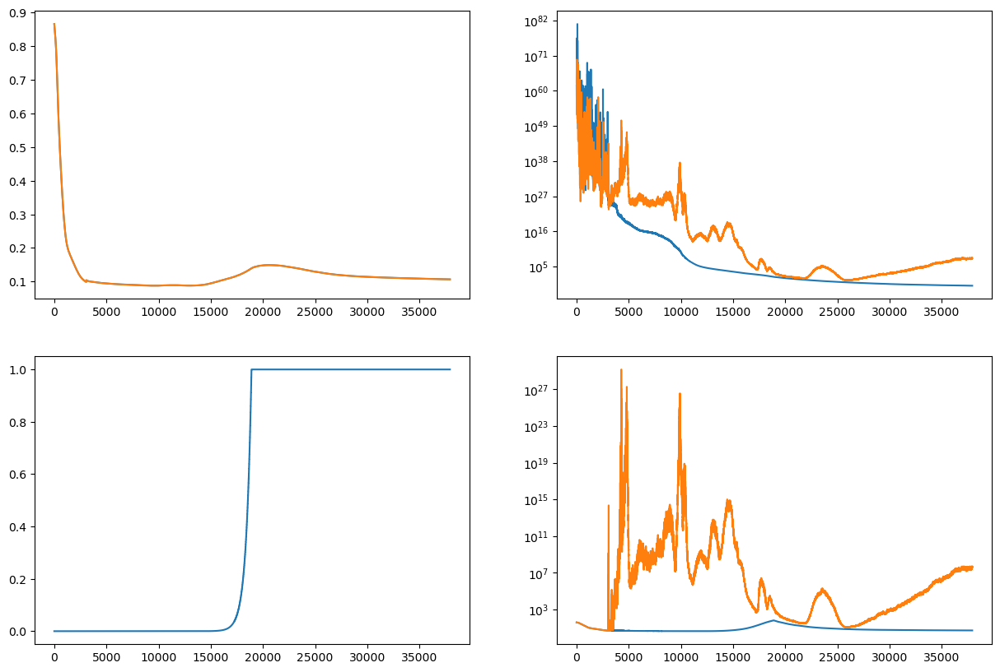

In [12]:
#Plot The Losses
fig, axs = plt.subplots(2, 2, figsize=(15, 10))

for data_set in experiment.rmsd_loss:
    axs[0,0].plot(np.arange(len(data_set)), data_set)
for data_set in experiment.pot_enr_loss:
    axs[0,1].plot(np.arange(len(data_set)), data_set)
for data_set in experiment.summ_loss:
    axs[1,1].plot(np.arange(len(data_set)), data_set)
axs[1,0].plot(np.arange(len(experiment.potential_coefficients)), experiment.potential_coefficients)

#axs[0,0].set_yscale('log')
axs[0,1].set_yscale('log')
#axs[1,0].set_yscale('log')
axs[1,1].set_yscale('log')

#axs[0,0].set_xscale('log')
#axs[0,1].set_xscale('log')
#axs[1,0].set_xscale('log')
#axs[1,1].set_xscale('log')

In [13]:
rng_init = jax.random.PRNGKey(54)
rng, key = jax.random.split(rng_init)
recon, latents = experiment.state.apply_fn({'params':experiment.state.params}, experiment.test_data, rng)

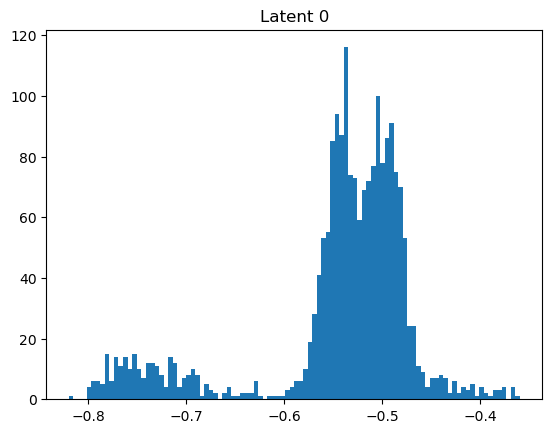

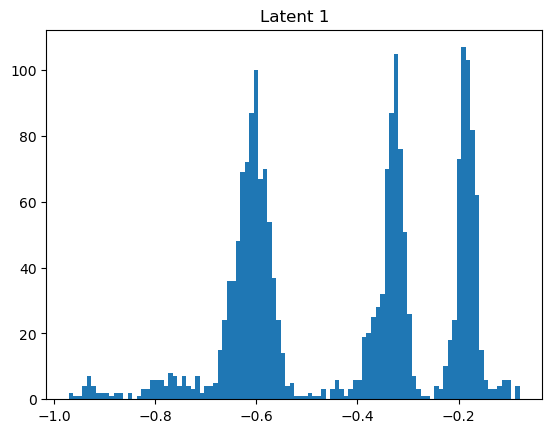

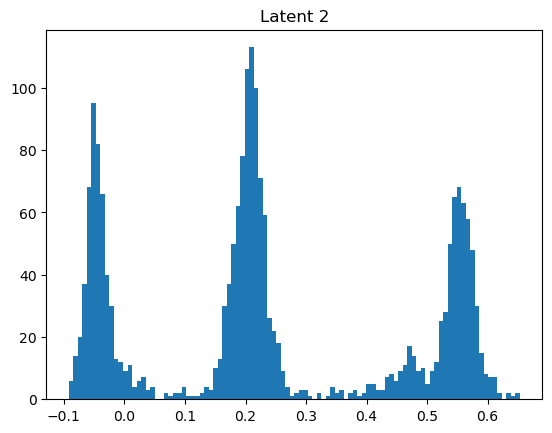

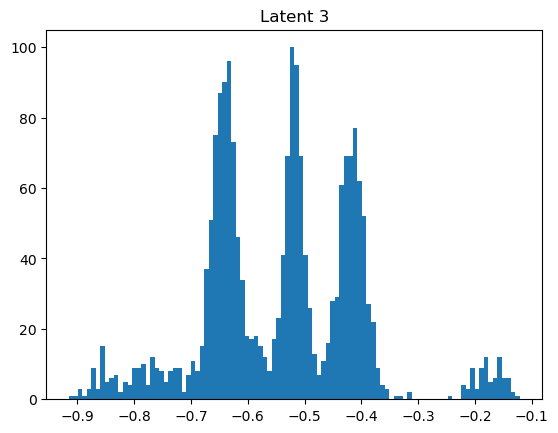

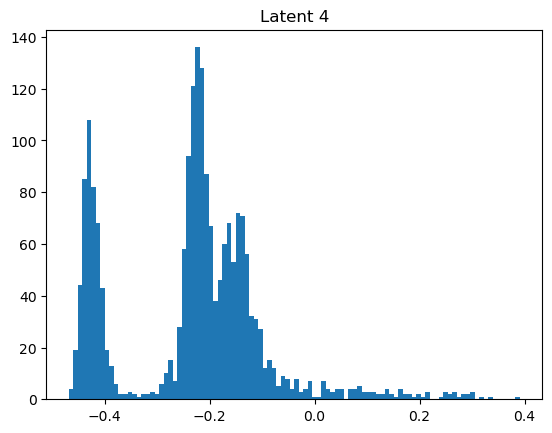

...

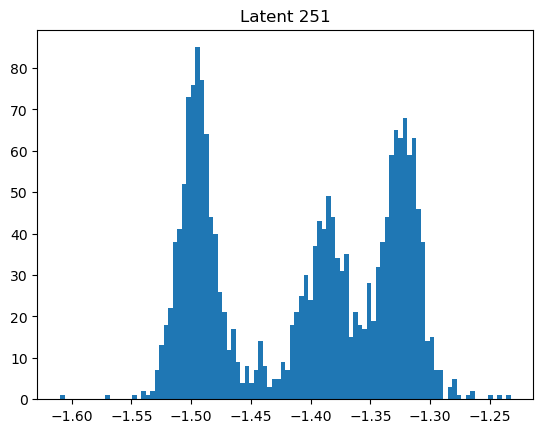

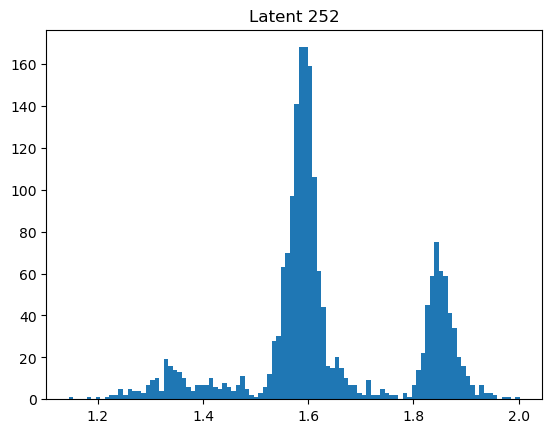

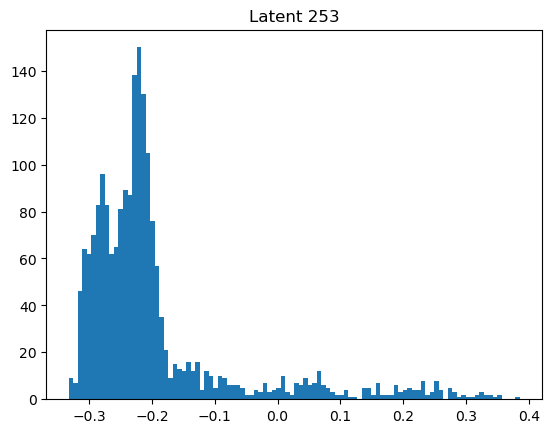

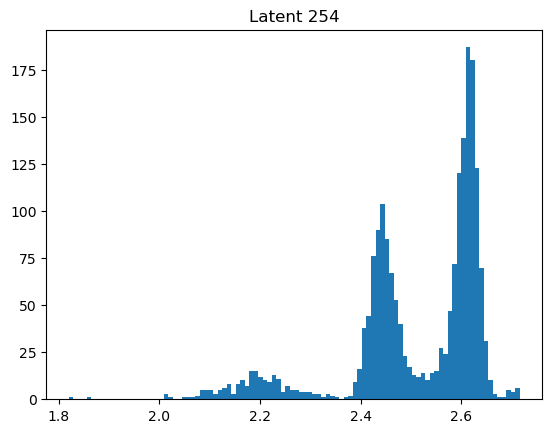

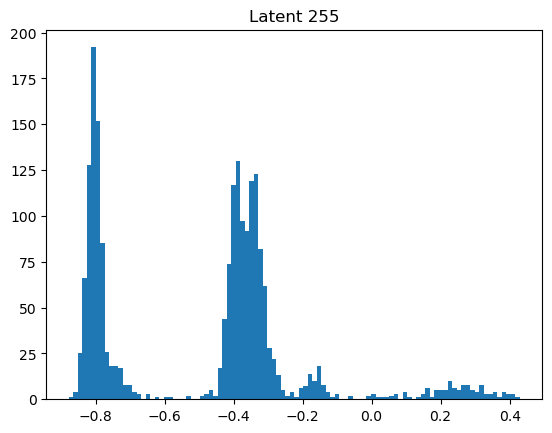

In [14]:
for i in range(latents.shape[-1]):
    plt.clf()
    plt.title(f'Latent {i}')
    _ = plt.hist(latents[:, i], bins=100)
    plt.show()

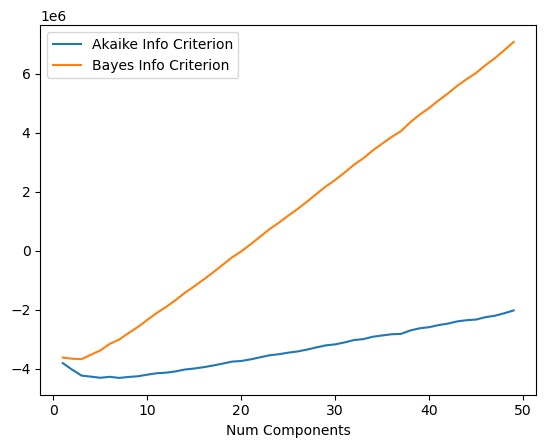

minimums: Akaike 7 Bayes 3


In [15]:
from sklearn.mixture import GaussianMixture
ics = []
for i in range(1, 50):
    X = np.array(latents)
    MM = GaussianMixture(n_components=i).fit(X)
    ics.append((i, MM.aic(X), MM.bic(X)))
ics = np.array(ics)
plt.clf()
_ = plt.plot(ics[:, 0], ics[:, 1])
_ = plt.plot(ics[:, 0], ics[:, 2])
plt.legend(('Akaike Info Criterion', 'Bayes Info Criterion'))
plt.xlabel('Num Components')
plt.show()
print(f'minimums: Akaike {np.argmin(ics[:,1]) + 1} Bayes {np.argmin(ics[:,2]) + 1}')

In [16]:
X = np.array(latents)
MM = GaussianMixture(n_components=5).fit(X) #chosen based on above graph
samples = MM.sample(2000)[0]

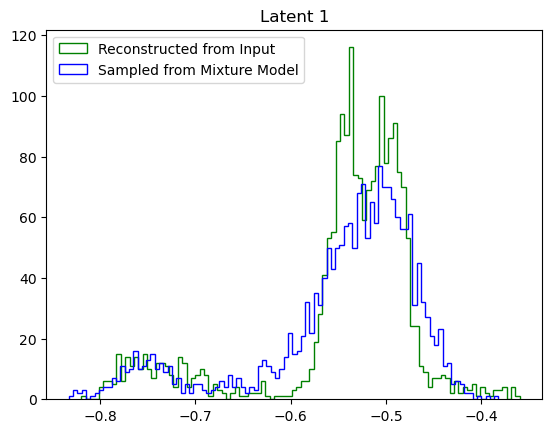

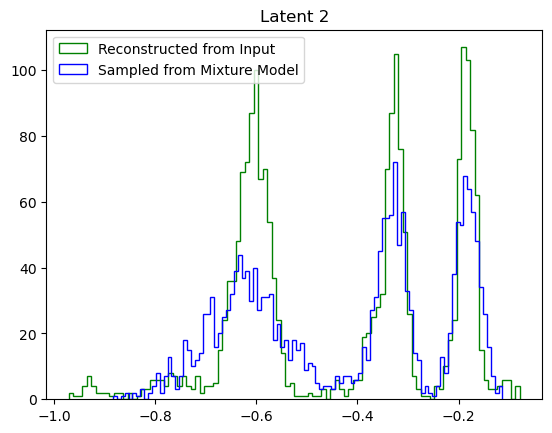

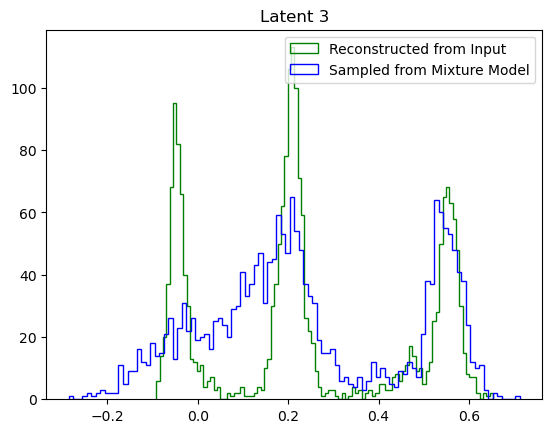

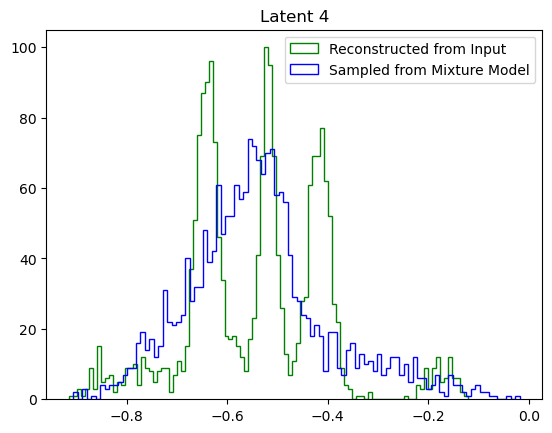

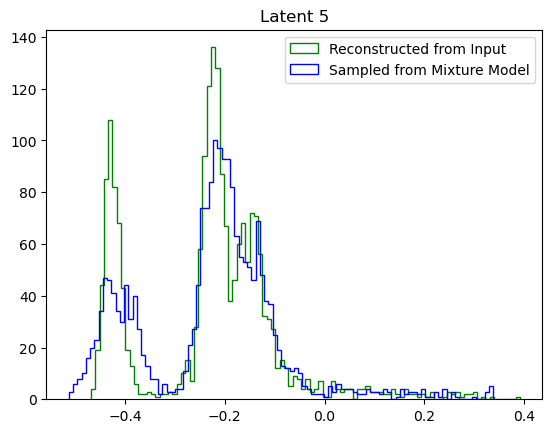

...

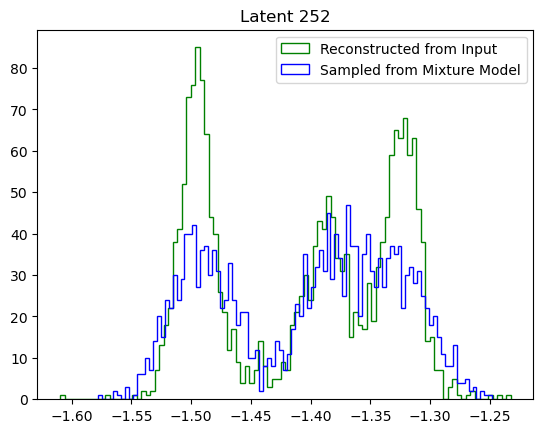

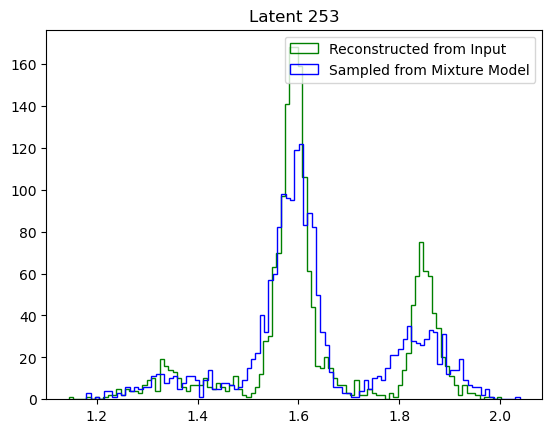

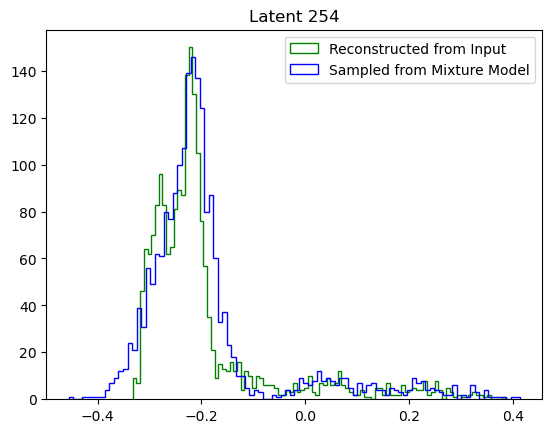

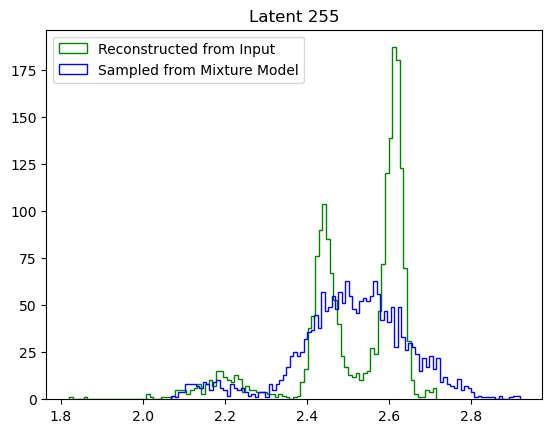

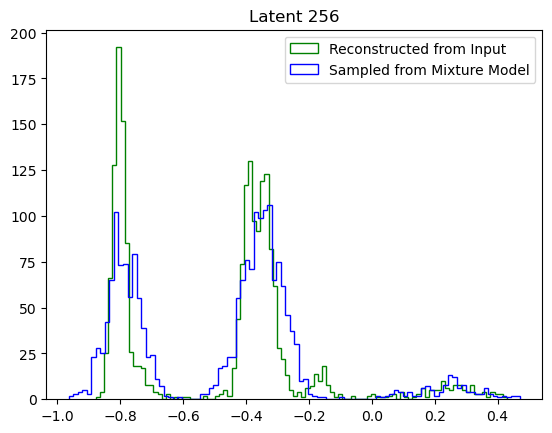

In [17]:
for i in range(samples.shape[-1]):
    plt.clf()
    _ = plt.hist(latents[:,i], bins=100, histtype='step', color='g')
    _ = plt.hist(samples[:,i], bins=100, histtype='step', color='b')
    plt.legend(('Reconstructed from Input', 'Sampled from Mixture Model'))
    plt.title(f'Latent {i+1}')
    plt.show()

In [ ]:
import scipy
n_L = latents.shape[-1]
fig, axs = plt.subplots(n_L, n_L, figsize=(15, 10), sharex='col', sharey='row')
for i in range(n_L):
    for j in range(n_L):
        axs[i,j].scatter(latents[:,j], latents[:,i])
        print(i, j, scipy.stats.pearsonr(latents[:,j], latents[:,i]))
fig.savefig('7L.png', dpi=600)

Excluding Outliers GMM - 1353 RECON - 64


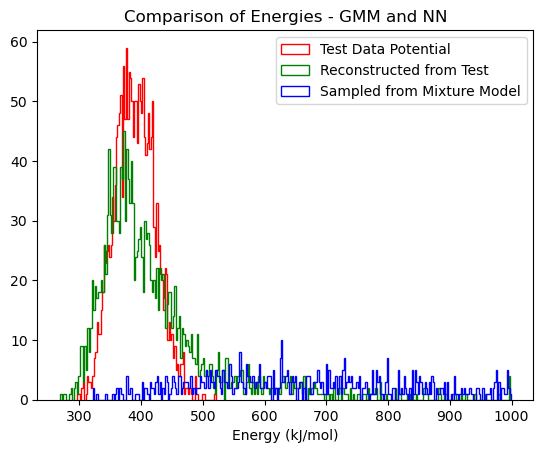

In [18]:
plt.clf()

recon_energies = gas_fun(recon)

decoded_samples = experiment.model.apply({'params': experiment.state.params}, samples, rng, method=experiment.model.decode)
sampled_energies = gas_fun(decoded_samples)

org_energies = gas_fun(experiment.test_data)

threshold = 1e3
num_excluded_gmm = len(sampled_energies) - len(sampled_energies[sampled_energies<threshold])
num_excluded_nn  = len(recon_energies) - len(recon_energies[recon_energies<threshold])
print(f'Excluding Outliers GMM - {num_excluded_gmm} RECON - {num_excluded_nn}')

_ = plt.hist(org_energies[org_energies < threshold], bins=100, histtype='step', color='r')
_ = plt.hist(recon_energies[recon_energies<threshold], bins=300, histtype='step', color='g')
_ = plt.hist(sampled_energies[sampled_energies<threshold], bins=300, histtype='step', color='b')

plt.legend(('Test Data Potential', 'Reconstructed from Test', 'Sampled from Mixture Model'))
plt.xlabel('Energy (kJ/mol)')
plt.title('Comparison of Energies - GMM and NN')
plt.show()

In [19]:
def write_traj(filename, traj_xyz): #(n conf, n_atoms*3) OR (n conf, n_atoms, 3)
    if traj_xyz.shape[-1] != 3:
        traj_xyz = traj_xyz.reshape(traj_xyz.shape[0], -1, 3)
    with md.formats.DCDTrajectoryFile(filename, 'w') as f:
        f.write(traj_xyz*10) #*10 because mdtraj loads data in nm but saves it in angstrom

my_dict = {'DA_TestData.dcd' : experiment.test_data, 'DA_ReconData.dcd' : recon, 'DA_GMM.dcd' : decoded_samples}
for key, value in zip(my_dict.keys(), my_dict.values()):
    write_traj(key, value)

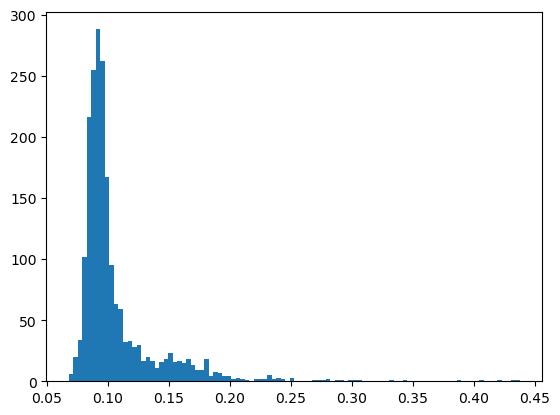

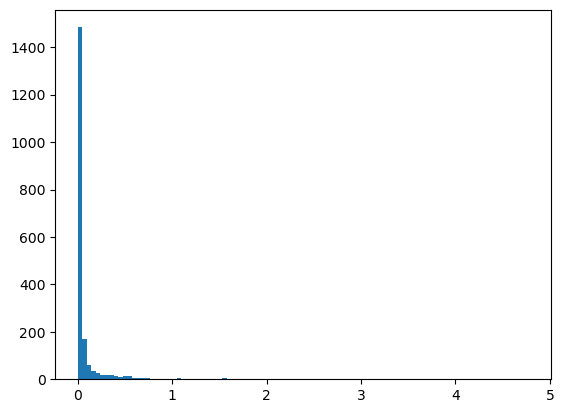

In [20]:
rmsds = atom_rmsd(experiment.test_data, recon)
plt.clf()
_ = plt.hist(rmsds, bins=100)
plt.show()
ener_comp = scaled_pot_enr_diff(experiment.test_data, recon)
plt.clf()
_ = plt.hist(ener_comp[ener_comp < 5], bins=100)
plt.show()

In [22]:
recon_train , _ = experiment.state.apply_fn({'params':experiment.state.params}, experiment.train_data, rng)
my_dict = {'DA_TrainData.dcd' : experiment.train_data, 'DA_ReconData_train.dcd' : recon_train}
for key, value in zip(my_dict.keys(), my_dict.values()):
    write_traj(key, value)